# Exploring *WorldFloods*

* **Last Modified**: 9-1-2023
* **Authors**: Gonzalo Mateo-García, Enrique Portalés-Julià
---

This notebook shows the locations and some of the products of the *WorldFloodsv2* dataset published in:

> E. Portalés-Julià, G. Mateo-García, C. Purcell, and L. Gómez-Chova [Global flood extent segmentation in optical satellite images](https://www.nature.com/articles/s41598-023-47595-7). _Scientific Reports 13, 20316_ (2023). DOI: 10.1038/s41598-023-47595-7.

## Download dataset

Download the [WorldFloodsv2](https://huggingface.co/datasets/isp-uv-es/WorldFloodsv2/) dataset from HuggingFace 🤗:

```
huggingface-cli download --cache-dir /path/to/cachedir --local-dir /path/to/localdir/WorldFloodsv2 --repo-type dataset isp-uv-es/WorldFloodsv2
```

* **Note 1**: the dataset requires approximately 76Gb of disk storage!
* **Note 2**: the `local_dir` variable in this notebook should point to the `local-dir` argument in the previous line.

## Explore the locations of the products

In [1]:
import pandas as pd
import geopandas as gpd
from georeader import window_utils
from shapely.geometry import box
import os

local_dir = "/home/gonzalo/git/ml4floods/WorldFloodsv2"
metadata_file = os.path.join(local_dir,"dataset_metadata.csv")
metadata = pd.read_csv(metadata_file)
metadata["geometry"] = metadata.apply(lambda row: window_utils.polygon_to_crs(box(*eval(row.bounds)),row.crs,"EPSG:4326"),
                                      axis=1)
metadata = gpd.GeoDataFrame(metadata,crs="EPSG:4326")
metadata = metadata.sort_values(["split","event id"])
metadata[["event id", "split", "s2_date","geometry"]].explore(column='split', cmap=['red','blue' ,'green'])

/home/gonzalo/mambaforge/envs/ml4floods2/lib/python3.10/site-packages/geopandas/explore.py:400: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  elif pd.api.types.is_categorical_dtype(gdf[column]):


## Plot all test and validation images

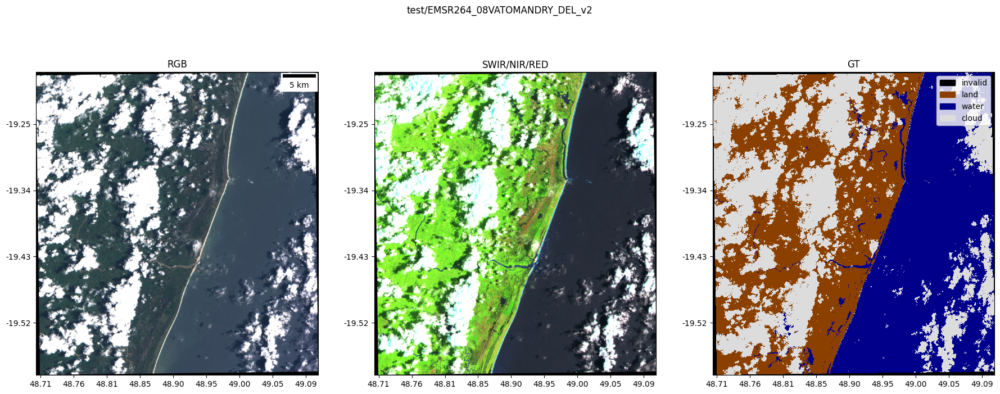

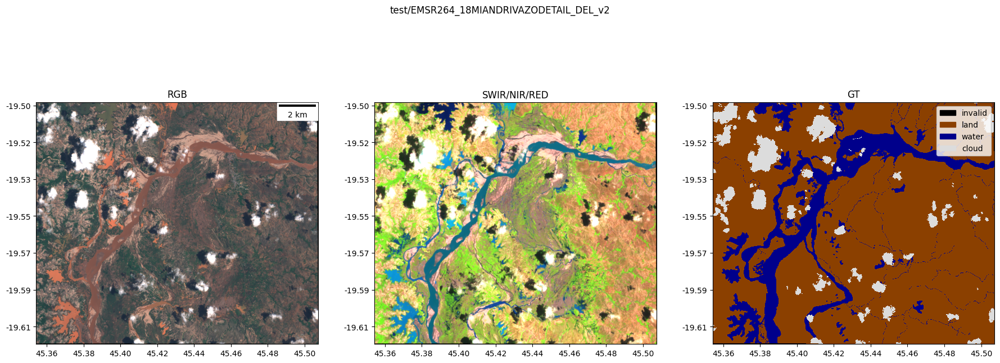

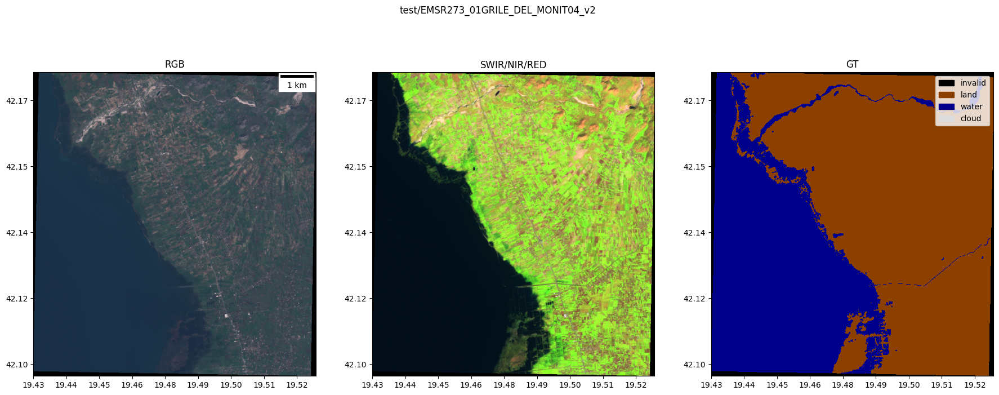

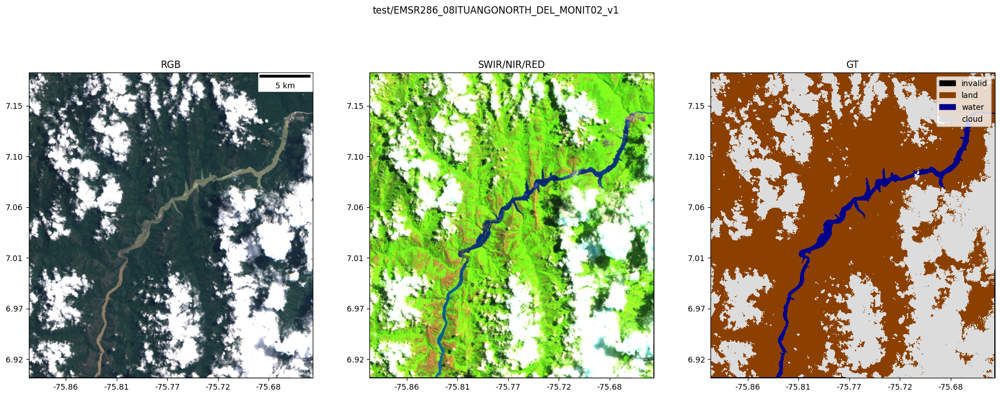

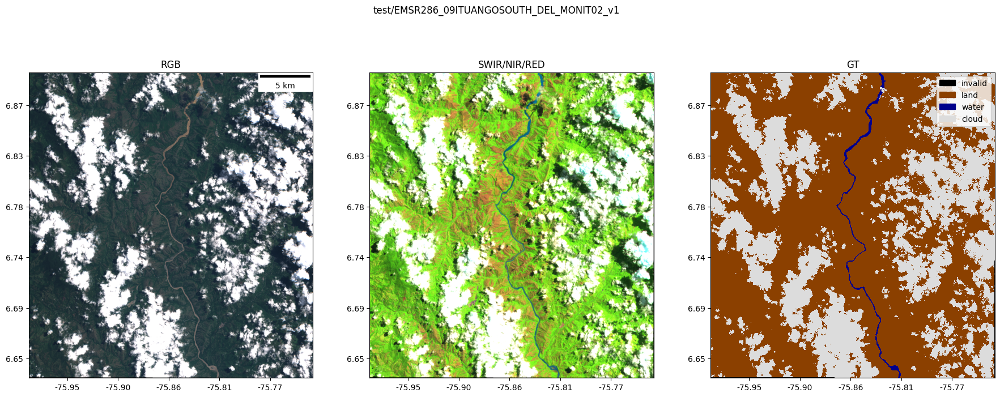

...

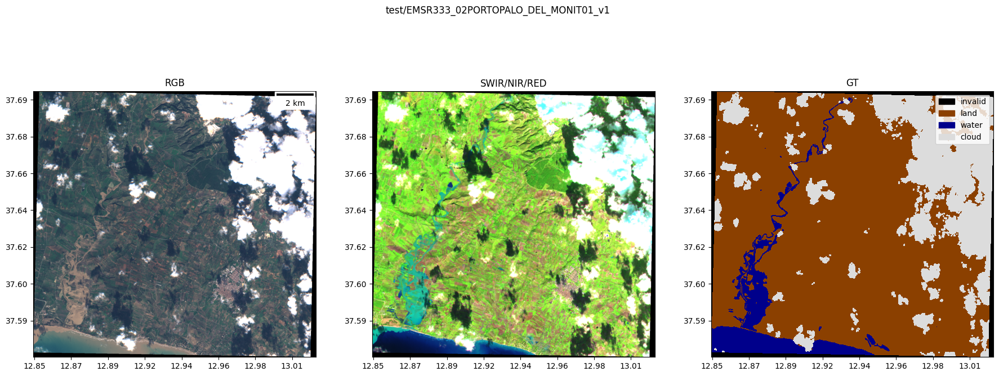

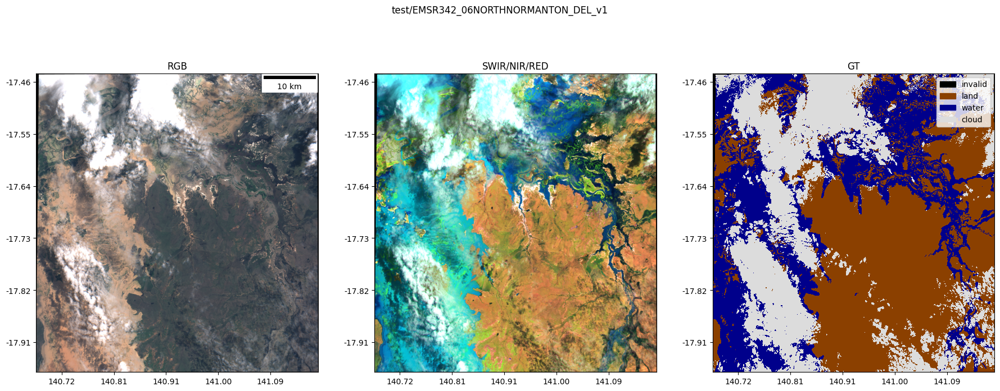

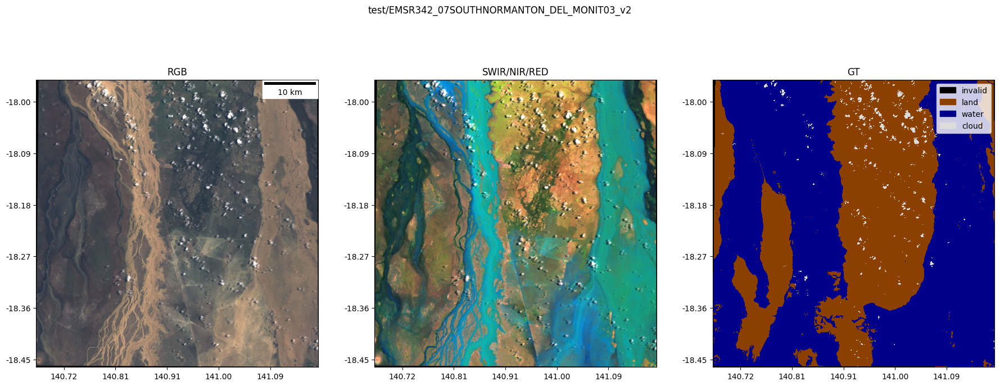

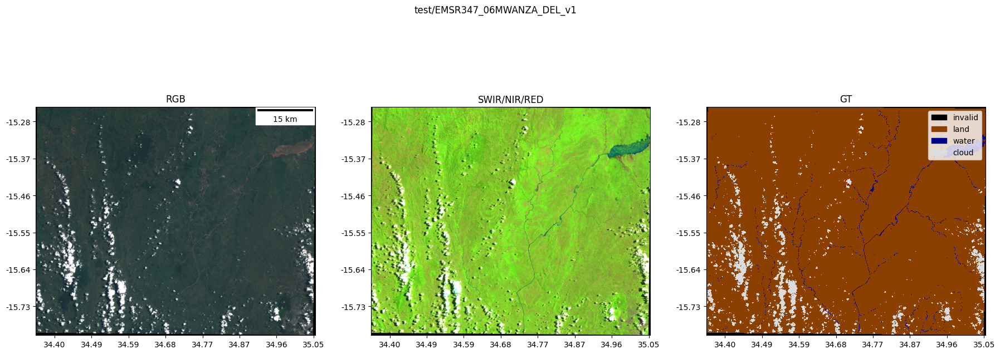

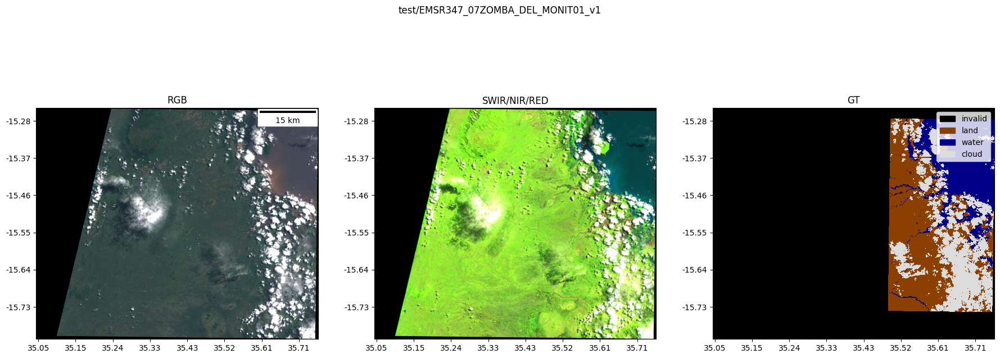

In [ ]:
from ml4floods.visualization import plot_utils
import matplotlib.pyplot as plt
from georeader import plot
from georeader.rasterio_reader import RasterioReader
from ml4floods.data.worldfloods.configs import BANDS_S2, COLORS_WORLDFLOODS

s2_bands_read = ["B2","B3", "B4", "B8", "B11", "B12"]
s2_band_indexes = [BANDS_S2.index(b)+1 for b in s2_bands_read]
for record in metadata[metadata.split.isin(["test","val"])].to_dict(orient="records"):
    s2_file = os.path.join(local_dir,record["split"],"S2",record["event id"]+".tif")
    if not os.path.exists(s2_file):
        continue

    rst = RasterioReader(s2_file,indexes=s2_band_indexes).load()
    
    fig, ax = plt.subplots(1,3,figsize=(22,8))
    plot.show((rst.isel({"band": [2,1,0]})/3_500).clip(0,1),ax=ax[0],add_scalebar=True,
            title="RGB")
    plot.show((rst.isel({"band": [4,3,2]})/3_500).clip(0,1),ax=ax[1], title="SWIR/NIR/RED")
    gt_file = os.path.join(local_dir,record["split"],"gt",record["event id"]+".tif")
    rst_gt = RasterioReader(gt_file).load()
    v1gt = rst_gt.isel({"band": 1})
    v1gt.values[rst_gt.values[0] == 2] = 3

    plot.plot_segmentation_mask(v1gt, color_array=COLORS_WORLDFLOODS, 
                                interpretation_array=plot_utils.INTERPRETATION_WORLDFLOODS,
                                ax=ax[2])
    ax[2].set_title("GT")
    s2split = s2_file.split("/")
    title = f"{record['split']}/{record['event id']}"
    plt.suptitle(title)
    plt.show()

In [ ]:
(rst_gt.values[0] == 2).shape